# TASK 1: USER OVERVIEW ANALYSIS

Since customers are take significant role in the success of any business in this task several exploratory, descriptive and visualization steps are performed so that marketing teams in direct contact with the customers could better understand their customers.

### Importing important libraries

In [1]:
import os
import sys
sys.path.append(os.path.abspath(os.path.join('../scripts')))
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
#sys.path.remove('C:\\Users\\mikyg\\OneDrive\\Desktop\\10 Acadamy\\Week 1\\Telecom-User-Analytics\\scripts')
sys.path

['C:\\Users\\mikyg\\OneDrive\\Desktop\\10 Acadamy\\Week 1\\Telecom-User-Analytics\\notebooks',
 'C:\\Users\\mikyg\\anaconda3\\python39.zip',
 'C:\\Users\\mikyg\\anaconda3\\DLLs',
 'C:\\Users\\mikyg\\anaconda3\\lib',
 'C:\\Users\\mikyg\\anaconda3',
 '',
 'C:\\Users\\mikyg\\AppData\\Roaming\\Python\\Python39\\site-packages',
 'C:\\Users\\mikyg\\anaconda3\\lib\\site-packages',
 'C:\\Users\\mikyg\\anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\mikyg\\anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\mikyg\\anaconda3\\lib\\site-packages\\Pythonwin',
 'C:\\Users\\mikyg\\OneDrive\\Desktop\\10 Acadamy\\Week 1\\Telecom-User-Analytics\\scripts']

In [2]:
#Ignore warnings by importing the "warnings" library
import warnings
warnings.filterwarnings('ignore')

In [3]:
import numpy as np
import pandas as pd
import IPython
from IPython.display import Image
from assistant_functions import Assistants
from cleaner import CleanTelecomData

In [4]:
#Read the dataset into this notebook
db = pd.read_csv('../data/Week1_challenge_data_source(CSV).csv', na_values=['?', None])
db.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,1.311448e+19,4/4/2019 12:01,770.0,4/25/2019 14:35,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16456699548519E+015,...,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.311448e+19,4/9/2019 13:04,235.0,4/25/2019 8:15,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,1.311448e+19,4/9/2019 17:42,1.0,4/25/2019 11:58,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,1.311448e+19,4/10/2019 0:31,486.0,4/25/2019 7:36,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,1.311448e+19,4/12/2019 20:10,565.0,4/25/2019 10:40,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


### Data Introduction

Before performing any type of data cleaning steps lets have a breif introduction of the data. We can achieve this by defining all methods related to data introduction in a single class DataIntroduction

In [5]:
#Create a class with set of methods that can automate the following data introduction phases:
    # 1)Column Names
    # 2)Number of data points
    # 3)Datatypes
    # 4)Summary

class DataIntroduction:
    def __init__(self, df):
        
        self.df = df
    
    # returning the column names in the dataframe
    def column_names(self):
        return self.df.columns.tolist()
    
    # returning the total number of data points in the dataframe
    def number_of_data_points(self):
        return self.df.shape[0] * self.df.shape[1]
    
    # returning the number of rows and column information
    def get_info(self):
        row_count, col_count = self.df.shape
    
        print(f"Number of rows: {row_count}")
        print(f"Number of columns: {col_count}")
        print("================================")

        return (row_count, col_count), self.df.info()
    
    # returning the summary about the dataframe
    def get_stat_summary(self):
        return self.df.describe()

In [6]:
dataintroduction = DataIntroduction(db)

Let's get introduced to the names of the column in the data ...

In [7]:
dataintroduction.column_names()

['Bearer Id',
 'Start',
 'Start ms',
 'End',
 'End ms',
 'Dur. (ms)',
 'IMSI',
 'MSISDN/Number',
 'IMEI',
 'Last Location Name',
 'Avg RTT DL (ms)',
 'Avg RTT UL (ms)',
 'Avg Bearer TP DL (kbps)',
 'Avg Bearer TP UL (kbps)',
 'TCP DL Retrans. Vol (Bytes)',
 'TCP UL Retrans. Vol (Bytes)',
 'DL TP < 50 Kbps (%)',
 '50 Kbps < DL TP < 250 Kbps (%)',
 '250 Kbps < DL TP < 1 Mbps (%)',
 'DL TP > 1 Mbps (%)',
 'UL TP < 10 Kbps (%)',
 '10 Kbps < UL TP < 50 Kbps (%)',
 '50 Kbps < UL TP < 300 Kbps (%)',
 'UL TP > 300 Kbps (%)',
 'HTTP DL (Bytes)',
 'HTTP UL (Bytes)',
 'Activity Duration DL (ms)',
 'Activity Duration UL (ms)',
 'Dur. (ms).1',
 'Handset Manufacturer',
 'Handset Type',
 'Nb of sec with 125000B < Vol DL',
 'Nb of sec with 1250B < Vol UL < 6250B',
 'Nb of sec with 31250B < Vol DL < 125000B',
 'Nb of sec with 37500B < Vol UL',
 'Nb of sec with 6250B < Vol DL < 31250B',
 'Nb of sec with 6250B < Vol UL < 37500B',
 'Nb of sec with Vol DL < 6250B',
 'Nb of sec with Vol UL < 1250B',
 'Socia

Then we can get to know the total number of data points to understand how big our data is ...

In [8]:
print(f"This data consists of {dataintroduction.number_of_data_points()} data points")

This data consists of 8250055 data points


We can get a deeper look at the size of the data using the get info function form the DataIntroduction class

In [9]:
dataintroduction.get_info()

Number of rows: 150001
Number of columns: 55
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 55 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Bearer Id                                 149010 non-null  float64
 1   Start                                     150000 non-null  object 
 2   Start ms                                  150000 non-null  float64
 3   End                                       150000 non-null  object 
 4   End ms                                    150000 non-null  float64
 5   Dur. (ms)                                 150000 non-null  float64
 6   IMSI                                      149431 non-null  float64
 7   MSISDN/Number                             148935 non-null  float64
 8   IMEI                                      149429 non-null  float64
 9   Last Location Name                        14884

((150001, 55), None)

Now we can look at the statistical summary about our data which contains Count, Mean, Median .....

In [10]:
dataintroduction.get_stat_summary()

,Bearer Id,Start ms,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
count,1.490100e+05,150000.000000,150000.000000,1.500000e+05,1.494310e+05,1.489350e+05,1.494290e+05,122172.000000,122189.000000,150000.000000,...,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500000e+05,1.500000e+05
mean,1.013887e+19,499.188200,498.800880,1.046086e+05,2.082016e+14,4.188282e+10,4.847455e+13,109.795706,17.662883,13300.045927,...,1.163407e+07,1.100941e+07,1.162685e+07,1.100175e+07,4.220447e+08,8.288398e+06,4.211005e+08,8.264799e+06,4.112121e+07,4.546434e+08
std,2.893173e+18,288.611834,288.097653,8.103762e+04,2.148809e+10,2.447443e+12,2.241637e+13,619.782739,84.793524,23971.878541,...,6.710569e+06,6.345423e+06,6.725218e+06,6.359490e+06,2.439675e+08,4.782700e+06,2.432050e+08,4.769004e+06,1.127639e+07,2.441429e+08
min,6.917538e+18,0.000000,0.000000,7.142000e+03,2.040471e+14,3.360100e+10,4.400152e+11,0.000000,0.000000,0.000000,...,5.300000e+01,1.050000e+02,4.200000e+01,3.500000e+01,2.516000e+03,5.900000e+01,3.290000e+03,1.480000e+02,2.866892e+06,7.114041e+06
25%,7.349883e+18,250.000000,251.000000,5.744050e+04,2.082014e+14,3.365130e+10,3.546071e+13,32.000000,2.000000,43.000000,...,5.833501e+06,5.517965e+06,5.777156e+06,5.475981e+06,2.104733e+08,4.128476e+06,2.101869e+08,4.145943e+06,3.322201e+07,2.431068e+08
50%,7.349883e+18,499.000000,500.000000,8.639900e+04,2.082015e+14,3.366371e+10,3.572201e+13,45.000000,5.000000,63.000000,...,1.161602e+07,1.101345e+07,1.164222e+07,1.099638e+07,4.234081e+08,8.291208e+06,4.218030e+08,8.267071e+06,4.114331e+07,4.558411e+08
75%,1.304243e+19,749.000000,750.000000,1.324302e+05,2.082018e+14,3.368349e+10,8.611970e+13,70.000000,15.000000,19710.750000,...,1.744852e+07,1.651556e+07,1.747048e+07,1.650727e+07,6.331742e+08,1.243162e+07,6.316918e+08,1.238415e+07,4.903424e+07,6.657055e+08
max,1.318654e+19,999.000000,999.000000,1.859336e+06,2.140743e+14,8.823971e+14,9.900120e+13,96923.000000,7120.000000,378160.000000,...,2.325910e+07,2.201196e+07,2.325919e+07,2.201196e+07,8.434419e+08,1.655879e+07,8.434425e+08,1.655882e+07,7.833131e+07,9.029696e+08


In [11]:
class UserOverview:
    
    def __init__(self, df):
        
        self.df = df
    
    #This method replaces the spaces available in the column names into underscores such that it can be well formated and understood by the reader
    def convert_labels(self):
        self.df.columns = [column.replace(' ', '_').lower() for column in self.df.columns]
        return self.df
    
    # This method returns the count of distinct items in a column
    def get_count(self, column_name):
        return self.df[column_name].value_counts()
    
    # This method returns the null count for a given column column_name
    def get_null_count(self):
        return self.df.isnull().sum()
    
    # This method returns the total number of missing values in the dataframe
    def get_number_of_missing_values(self):
        self.df.isnull().sum().sum()
        
    # This method calculates the percentage of missing values and creates a dataframe for storing a sorted list of the columns and their respective values of null_percentages
    def get_percent_missing(self):
        assistant = Assistants()
        
        percent_missing = assistant.percent_missing(self.df)
        
        null_percent_df = pd.DataFrame(columns = ['column','null_percent'])
        columns = self.df.columns.values.tolist()
        
        null_percent_df['column'] = columns
        null_percent_df['null_percent'] = null_percent_df['column'].map(lambda x: assistant.percent_missing_for_col(self.df, x))
        
        return null_percent_df.sort_values(by=['null_percent'], ascending = False), percent_missing
        
    # This method returns the skiwness of the columns in our dataframe
    def get_skiwness_coeff(self):
        return self.df.skew(axis = 0)
    
    # The following section of this class contains all the methods to show the following insights in from our dataframe:
        #1) Top 10 handsets used by customers
        #2) Top 3 handsets manufacturers
        #3) Top 5 handsets per top 3 handset manufacturers
    
    # This method returns the top 10 handsets featured by the customers
    def get_top_handset_type(self, top=10):
        return self.df['handset_type'].value_counts().head(top)
    
    #This method returns the top 3 handset manufacturers
    def get_top_manufacturer(self, top=3):
        return self.df['handset_manufacturer'].value_counts().head(top)
    
    #This method returns top 5 hansets per top 3 handset manufacturers
    def get_group_handset_by_manufacturer(self, manufacturer, top=5):
        return self.df.groupby('handset_manufacturer')['handset_type'].value_counts()[manufacturer].head(top)
        

In [12]:
# An instance of the UserOverView class called userOverview 
userOverview = UserOverview(db)

In [13]:
db = userOverview.convert_labels()
userOverview = UserOverview(db)
db.head()

,bearer_id,start,start_ms,end,end_ms,dur._(ms),imsi,msisdn/number,imei,last_location_name,...,youtube_dl_(bytes),youtube_ul_(bytes),netflix_dl_(bytes),netflix_ul_(bytes),gaming_dl_(bytes),gaming_ul_(bytes),other_dl_(bytes),other_ul_(bytes),total_ul_(bytes),total_dl_(bytes)
0,1.311448e+19,4/4/2019 12:01,770.0,4/25/2019 14:35,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16456699548519E+015,...,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.311448e+19,4/9/2019 13:04,235.0,4/25/2019 8:15,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,1.311448e+19,4/9/2019 17:42,1.0,4/25/2019 11:58,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,1.311448e+19,4/10/2019 0:31,486.0,4/25/2019 7:36,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,1.311448e+19,4/12/2019 20:10,565.0,4/25/2019 10:40,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


### Handling Missing Values

Get the null counts in each column

In [14]:
print("Null values count")
userOverview.get_null_count()

Null values count


bearer_id                                      991
start                                            1
start_ms                                         1
end                                              1
end_ms                                           1
dur._(ms)                                        1
imsi                                           570
msisdn/number                                 1066
imei                                           572
last_location_name                            1153
avg_rtt_dl_(ms)                              27829
avg_rtt_ul_(ms)                              27812
avg_bearer_tp_dl_(kbps)                          1
avg_bearer_tp_ul_(kbps)                          1
tcp_dl_retrans._vol_(bytes)                  88146
tcp_ul_retrans._vol_(bytes)                  96649
dl_tp_<_50_kbps_(%)                            754
50_kbps_<_dl_tp_<_250_kbps_(%)                 754
250_kbps_<_dl_tp_<_1_mbps_(%)                  754
dl_tp_>_1_mbps_(%)             

It is a customary to calculate the amount of missing data in pur dataframe in percentage since it would enable us to either impute(insert) data or drop the missing values if they can be neglected.It is a recommended practice to drop the rows with missing values if the percentage is less than 10%.

In [15]:
null_percent_df, overall_missing = userOverview.get_percent_missing()
print(f"The overall missing perceentage is: {overall_missing}%")
print("=============================================")
null_percent_df

The overall missing perceentage is: 12.5%


,column,null_percent
34,nb_of_sec_with_37500b_<_vol_ul,86.84
36,nb_of_sec_with_6250b_<_vol_ul_<_37500b,74.56
31,nb_of_sec_with_125000b_<_vol_dl,65.02
15,tcp_ul_retrans._vol_(bytes),64.43
33,nb_of_sec_with_31250b_<_vol_dl_<_125000b,62.39
32,nb_of_sec_with_1250b_<_vol_ul_<_6250b,61.93
35,nb_of_sec_with_6250b_<_vol_dl_<_31250b,58.88
14,tcp_dl_retrans._vol_(bytes),58.76
25,http_ul_(bytes),54.54
24,http_dl_(bytes),54.32


Discover the skewness of the data...

In [16]:
db.skew(axis = 0)

bearer_id                                     0.026666
start_ms                                      0.000968
end_ms                                       -0.001163
dur._(ms)                                     3.952609
imsi                                         41.045956
msisdn/number                               332.155856
imei                                          1.071470
avg_rtt_dl_(ms)                              62.907828
avg_rtt_ul_(ms)                              28.457415
avg_bearer_tp_dl_(kbps)                       2.589437
avg_bearer_tp_ul_(kbps)                       4.503413
tcp_dl_retrans._vol_(bytes)                  15.951809
tcp_ul_retrans._vol_(bytes)                  84.113393
dl_tp_<_50_kbps_(%)                          -2.297803
50_kbps_<_dl_tp_<_250_kbps_(%)                3.271453
250_kbps_<_dl_tp_<_1_mbps_(%)                 4.566158
dl_tp_>_1_mbps_(%)                            5.370351
ul_tp_<_10_kbps_(%)                          -8.985016
10_kbps_<_

In [ ]:
#Visualize the skiwness of two columns that are extreme positively skewed skewed usin histograms
sns.displot(data=db, x=db['tcp_ul_retrans._vol_(bytes)'])

### Data cleaning

In [17]:
# Use the cleaner module in the scripts folder to clean the dataframe

cleanTelecomData = CleanTelecomData(db)

Cleaning on the way ....


### Data cleaning steps and their description
1) Convert the start and end columns to datetime format
2) Drop duplicate rows with null values, if they are not significant (if their contribution to the data is less than 1%)
3) Replace any missing value for the quantitative data with mean
4) Replace missing values fro categorical data using fill forward method
5) then any missing values for qantitative_data is replaced with mean
6) then any missing values for categorical data is replaced using fill forward method


In [18]:
cleaned_df = cleanTelecomData.convert_to_datetime(db)

cleaned_df = cleanTelecomData.drop_duplicate(cleaned_df)

cleaned_df = cleanTelecomData.drop_rows_with_null_values(cleaned_df, 1)

cleaned_df = cleanTelecomData.handle_missing_qantitative_data_with_mean(cleaned_df)

cleaned_df = cleanTelecomData.handle_missing_categorical_data_with(cleaned_df, "ffill")

#Observing at the dataset after completeing the nessary cleaning stages....
cleaned_df.head()

,bearer_id,start,start_ms,end,end_ms,dur._(ms),imsi,msisdn/number,imei,last_location_name,...,youtube_dl_(bytes),youtube_ul_(bytes),netflix_dl_(bytes),netflix_ul_(bytes),gaming_dl_(bytes),gaming_ul_(bytes),other_dl_(bytes),other_ul_(bytes),total_ul_(bytes),total_dl_(bytes)
0,1.311448e+19,2019-04-04 12:01:00,770.0,2019-04-25 14:35:00,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16456699548519E+015,...,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.311448e+19,2019-04-09 13:04:00,235.0,2019-04-25 08:15:00,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,1.311448e+19,2019-04-09 17:42:00,1.0,2019-04-25 11:58:00,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,1.311448e+19,2019-04-10 00:31:00,486.0,2019-04-25 07:36:00,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,1.311448e+19,2019-04-12 20:10:00,565.0,2019-04-25 10:40:00,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


In [20]:
cleaned_df.shape

(146891, 55)

### Check for remaining missing values
Now we can check for missing values in the datframe after going through all the necessary cleaning stages....

In [22]:
new_userOverview = UserOverview(cleaned_df)

null_percent_df, overall_missing = new_userOverview.get_percent_missing()
print(f"The overall missing perceentage is: {overall_missing}%")
print("=============================================")
null_percent_df

The overall missing perceentage is: 0.0%


,column,null_percent
0,bearer_id,0.0
41,google_dl_(bytes),0.0
30,handset_type,0.0
31,nb_of_sec_with_125000b_<_vol_dl,0.0
32,nb_of_sec_with_1250b_<_vol_ul_<_6250b,0.0
33,nb_of_sec_with_31250b_<_vol_dl_<_125000b,0.0
34,nb_of_sec_with_37500b_<_vol_ul,0.0
35,nb_of_sec_with_6250b_<_vol_dl_<_31250b,0.0
36,nb_of_sec_with_6250b_<_vol_ul_<_37500b,0.0
37,nb_of_sec_with_vol_dl_<_6250b,0.0


## Top 10 Handsets Featured By Customers

In [23]:
new_userOverview.get_top_handset_type()

Huawei B528S-23A                19373
Apple iPhone 6S (A1688)          9369
Apple iPhone 6 (A1586)           8967
undefined                        8820
Apple iPhone 7 (A1778)           6240
Apple iPhone Se (A1723)          5151
Apple iPhone 8 (A1905)           4961
Apple iPhone Xr (A2105)          4542
Samsung Galaxy S8 (Sm-G950F)     4404
Apple iPhone X (A1901)           3788
Name: handset_type, dtype: int64

## Top 3 Handset Manufacturers

In [24]:
new_userOverview.get_top_manufacturer()

Apple      59072
Samsung    39902
Huawei     33755
Name: handset_manufacturer, dtype: int64

## Top 5 Handset per Top 3 Handset Manufacturers

In [25]:
new_userOverview.get_group_handset_by_manufacturer('Apple')

handset_type
Apple iPhone 6S (A1688)    9369
Apple iPhone 6 (A1586)     8967
Apple iPhone 7 (A1778)     6240
Apple iPhone Se (A1723)    5151
Apple iPhone 8 (A1905)     4961
Name: handset_type, dtype: int64

In [26]:
new_userOverview.get_group_handset_by_manufacturer('Samsung')

handset_type
Samsung Galaxy S8 (Sm-G950F)    4404
Samsung Galaxy A5 Sm-A520F      3673
Samsung Galaxy J5 (Sm-J530)     3664
Samsung Galaxy J3 (Sm-J330)     3431
Samsung Galaxy S7 (Sm-G930X)    3106
Name: handset_type, dtype: int64

In [27]:
new_userOverview.get_group_handset_by_manufacturer('Huawei')

handset_type
Huawei B528S-23A                  19373
Huawei E5180                       2062
Huawei P20 Lite Huawei Nova 3E     2000
Huawei P20                         1471
Huawei Y6 2018                      984
Name: handset_type, dtype: int64

## Short interpretation and Recommendation for the Marketing Team

##### According to the user overview analysis conducted above
###### >The current users of TellCo company are using handsets from the Huawie, Apple and Samsung.
###### >The handset Huawei B528S-23A is the most dominant handset in the hands of the customers of TellCo.
###### >The Apple handset manufacturer is the lead variety handset provider for the customers of TellCo.
###### >Samsung Galaxy S8 (Sm-G950F) is the only handset representing the Samsung manufacturer in the list of top 10 handsets featured by customers
###### >The services of TellCo should periotize the needs of leading handset manufacturers (Apple, Samsung, Huawei respectively)

## xDR sessions Related Overviews

#### >>Number of xDR sessions

In [28]:
sessions = cleaned_df.groupby('msisdn/number').agg({'bearer_id': 'count'})
sessions = sessions.rename(columns= {'bearer_id': 'xDR_sessions'})
sessions.sort_values(by=['xDR_sessions'], ascending = False).head(20)

,xDR_sessions
msisdn/number,
3.362632e+10,18
3.361489e+10,17
3.362578e+10,17
3.365973e+10,16
3.367588e+10,15
3.376054e+10,15
3.366716e+10,13
3.360313e+10,12
3.376041e+10,12


In [29]:
# Get the statistical summary of the sessions dataframe using the describe function
sessions.describe()

,xDR_sessions
count,105719.000000
mean,1.389447
std,0.796173
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,18.000000


#### >>Session durations

In [30]:
#Can be calculated by finding the sum duration for each customer

durations = cleaned_df.groupby('msisdn/number').agg({'dur._(ms)': 'sum'})


durations=durations.rename(columns= {'dur._(ms)': 'total_duration(ms)'})
durations.sort_values(by=['total_duration(ms)'], ascending = False).head(10)

,total_duration(ms)
msisdn/number,
3.362578e+10,18553754.0
3.361489e+10,9966898.0
3.376054e+10,9279434.0
3.362632e+10,8791927.0
3.366716e+10,8744914.0
3.366469e+10,6288730.0
3.360313e+10,6287761.0
3.366746e+10,5649882.0
3.376041e+10,5321667.0


In [31]:
# Get the statistical summary of durations dataframe using the describe function
durations.describe()

,total_duration(ms)
count,1.057190e+05
mean,1.462114e+05
std,1.845391e+05
min,7.142000e+03
25%,7.272900e+04
50%,1.031110e+05
75%,1.727990e+05
max,1.855375e+07


#### >>Total Download(DL) and Total Upload(UL)

In [32]:
# Total Download(DL) and Total Upload(UL)
total_data_df = cleaned_df[['msisdn/number','total_ul_(bytes)','total_dl_(bytes)']].copy()
total_data_df = total_data_df.groupby('msisdn/number').sum()
total_data_df['total_data(bytes)'] = total_data_df['total_ul_(bytes)'] + total_data_df['total_dl_(bytes)']
total_data_df.sort_values(by=['total_data(bytes)'], ascending = False).head(10)

,total_ul_(bytes),total_dl_(bytes),total_data(bytes)
msisdn/number,,,
3.361489e+10,689483001.0,8.156743e+09,8.846226e+09
3.376054e+10,703478581.0,7.811295e+09,8.514774e+09
3.362578e+10,729577380.0,7.770043e+09,8.499621e+09
3.362632e+10,669650721.0,7.301517e+09,7.971167e+09
3.367588e+10,581568792.0,7.309542e+09,7.891111e+09
3.365973e+10,624260321.0,7.081602e+09,7.705863e+09
3.366646e+10,405060976.0,6.903440e+09,7.308501e+09
3.376041e+10,521518890.0,6.610852e+09,7.132371e+09
3.366471e+10,471244453.0,6.400774e+09,6.872018e+09


In [33]:
# Get the statistical summary of the data using the describe function
total_data_df.describe()

,total_ul_(bytes),total_dl_(bytes),total_data(bytes)
count,1.057190e+05,1.057190e+05,1.057190e+05
mean,5.713601e+07,6.317300e+08,6.888661e+08
std,3.527180e+07,4.609209e+08,4.869964e+08
min,2.866892e+06,8.827082e+06,3.324901e+07
25%,3.637849e+07,3.142406e+08,3.579501e+08
50%,4.676298e+07,5.693797e+08,6.169335e+08
75%,6.550410e+07,8.062981e+08,8.564738e+08
max,7.295774e+08,8.156743e+09,8.846226e+09


#### >>Total data volume (in Bytes) during this session for each application

In [34]:
# Compute total (UL and DL) for Social_media, google, email, youtube, netflix, gaming, other and the total of all
cleaned_df["social_media"] = cleaned_df["social_media_dl_(bytes)"] + cleaned_df['social_media_ul_(bytes)']
cleaned_df["google"] = cleaned_df["google_dl_(bytes)"] + cleaned_df["google_ul_(bytes)"]
cleaned_df['email'] = cleaned_df["email_dl_(bytes)"] + cleaned_df["email_ul_(bytes)"]
cleaned_df['youtube'] = cleaned_df["youtube_dl_(bytes)"] + cleaned_df["youtube_ul_(bytes)"]
cleaned_df['netflix'] = cleaned_df["netflix_dl_(bytes)"] + cleaned_df["netflix_ul_(bytes)"]
cleaned_df["gaming"] = cleaned_df["gaming_dl_(bytes)"] + cleaned_df["gaming_ul_(bytes)"]
cleaned_df['other']= cleaned_df["other_dl_(bytes)"]+ cleaned_df["other_ul_(bytes)"]
cleaned_df['total_data'] = cleaned_df['total_dl_(bytes)'] + cleaned_df['total_ul_(bytes)']

In [35]:
# Display sample the newly added columns to the dataframe...
app_total_data = cleaned_df[['msisdn/number','social_media','google',
                             'email', 'youtube','netflix', 'gaming','other']].copy()
app_total_data.groupby('msisdn/number').sum().sample(10)

,social_media,google,email,youtube,netflix,gaming,other
msisdn/number,,,,,,,
3.366691e+10,2547329.0,13969561.0,687350.0,36620458.0,14900348.0,2.160962e+08,2.157205e+08
3.367252e+10,189552.0,11445683.0,1883990.0,21369347.0,37233652.0,6.885001e+08,2.440416e+08
3.362056e+10,2080892.0,3654773.0,3043692.0,9795054.0,11088323.0,7.048865e+08,1.832990e+07
3.365281e+10,1185030.0,6387413.0,3392924.0,23798380.0,16662904.0,3.600044e+08,4.620579e+08
3.366347e+10,1056594.0,5727189.0,3221471.0,14142930.0,26462272.0,4.240201e+08,2.416629e+08
3.360347e+10,468108.0,24801084.0,2198663.0,61791387.0,40120461.0,1.152239e+09,1.408688e+09
3.362527e+10,4382847.0,8927521.0,4412973.0,45720979.0,46503007.0,1.333572e+09,1.476656e+09
3.366120e+10,2352163.0,13859247.0,4948082.0,24645307.0,34419587.0,1.409791e+09,5.792746e+08
3.365006e+10,866528.0,2615141.0,1547971.0,25436103.0,16264224.0,3.551397e+07,1.804450e+08


In [36]:
# Describe app_total_data(the data frame that contains the xDR session tracking applications info)
app_total_data.describe()

,msisdn/number,social_media,google,email,youtube,netflix,gaming,other
count,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05
mean,3.596855e+10,1.827740e+06,7.807978e+06,2.259078e+06,2.264199e+07,2.262936e+07,4.303551e+08,4.292667e+08
std,8.792026e+11,1.035571e+06,3.517121e+06,1.071128e+06,9.244557e+06,9.259223e+06,2.440902e+08,2.432095e+08
min,3.360100e+10,1.563000e+03,4.033000e+04,8.359000e+03,1.296550e+05,9.843200e+04,3.063580e+05,1.490450e+05
25%,3.365128e+10,9.313390e+05,4.943585e+06,1.359012e+06,1.599734e+07,1.598200e+07,2.186982e+08,2.184706e+08
50%,3.366369e+10,1.825390e+06,7.815399e+06,2.263843e+06,2.266341e+07,2.263459e+07,4.316651e+08,4.297978e+08
75%,3.368344e+10,2.727156e+06,1.068314e+07,3.159587e+06,2.929342e+07,2.928815e+07,6.415728e+08,6.396656e+08
max,3.370000e+14,3.650861e+06,1.552878e+07,4.518036e+06,4.519008e+07,4.519815e+07,8.592028e+08,8.595209e+08


In [37]:
# Now save our cleaned and processed data to the data folder with the name(../data/cleaned_data.csv) since this will be the data frame on which we will be conducting next steps of the data science pipeline.
file_path = "../data/clened_data.csv"
assistant = Assistants()
cleaned_df = assistant.save_csv(cleaned_df, file_path)

File Successfully Saved.!!!


In [37]:
#Re read the saved file...
cleaned_df = assistant.read_csv(csv_path = file_path)

file read as csv


In [47]:
#Re check for missing values....
assistant.percent_missing(cleaned_df)

0.0

In [48]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146891 entries, 0 to 146890
Data columns (total 53 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   bearer_id                       146891 non-null  float64
 1   start                           146891 non-null  object 
 2   start_ms                        146891 non-null  float64
 3   end                             146891 non-null  object 
 4   end_ms                          146891 non-null  float64
 5   dur._(ms)                       146891 non-null  float64
 6   imsi                            146891 non-null  float64
 7   msisdn/number                   146891 non-null  float64
 8   imei                            146891 non-null  float64
 9   last_location_name              146891 non-null  object 
 10  avg_rtt_dl_(ms)                 146891 non-null  float64
 11  avg_rtt_ul_(ms)                 146891 non-null  float64
 12  avg_bearer_tp_dl

## Exploratory Data Analysis

I have selected 14 data features which are important for perfroming relevant exploratory data analysis and conveying useful insihts for the bussiness behavior. Thus I have fetched this features into a separate data frame called "exploratory_df"

In [54]:
exploratory_df = cleaned_df[['msisdn/number','imei','last_location_name',
                                 'handset_manufacturer', 'handset_type', 'dur._(ms)', 
                                 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming','other', 'total_data'
                                ]]
exploratory_df = exploratory_df.rename(columns={'other':'other_data','msisdn/number': 'msisdn', 'dur._(ms)': 'duration(ms)'})

In [55]:
exploratory_df.head()

,msisdn,imei,last_location_name,handset_manufacturer,handset_type,duration(ms),social_media,google,email,youtube,netflix,gaming,other_data,total_data
0,3.366496e+10,3.552121e+13,9.16456699548519E+015,Samsung,Samsung Galaxy A5 Sm-A520F,1823652.0,1570185.0,2905912.0,3701304.0,18355943.0,17855187.0,292426453.0,180558843.0,345629377.0
1,3.368185e+10,3.579401e+13,L77566A,Samsung,Samsung Galaxy J5 (Sm-J530),1365104.0,1933278.0,4414096.0,937385.0,39359124.0,35565545.0,609920783.0,541959383.0,707185356.0
2,3.376063e+10,3.528151e+13,D42335A,Samsung,Samsung Galaxy A8 (2018),1361762.0,1726277.0,10229119.0,3363124.0,34425237.0,23751202.0,229980251.0,414908351.0,307690973.0
3,3.375034e+10,3.535661e+13,T21824A,undefined,undefined,1321509.0,657493.0,11811761.0,2070983.0,36534765.0,15092588.0,810387875.0,761837216.0,889352748.0
4,3.369980e+10,3.540701e+13,D88865A,Samsung,Samsung Sm-G390F,1089009.0,912788.0,7748843.0,2110349.0,34222253.0,17539799.0,531237049.0,564619822.0,607681403.0


In [56]:
#Convert the bytes values in social_media, google, email, youtube, netflix, gamimng, other_data, total_data into Megabytes...
list_byte_cols = ['social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other_data', 'total_data']
for col in list_byte_cols:
    exploratory_df[col] = assistant.convert_bytes_to_megabytes(exploratory_df, col)

### Univariate Analysis

In [58]:
# Starting with the quantitative data ...
quantitative_df = exploratory_df[['imei','duration(ms)', 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming', 'total_data', 'other_data']]
quantitative_df.head()

,imei,duration(ms),social_media,google,email,youtube,netflix,gaming,total_data,other_data
0,3.552121e+13,1823652.0,1.570185,2.905912,3.701304,18.355943,17.855187,292.426453,345.629377,180.558843
1,3.579401e+13,1365104.0,1.933278,4.414096,0.937385,39.359124,35.565545,609.920783,707.185356,541.959383
2,3.528151e+13,1361762.0,1.726277,10.229119,3.363124,34.425237,23.751202,229.980251,307.690973,414.908351
3,3.535661e+13,1321509.0,0.657493,11.811761,2.070983,36.534765,15.092588,810.387875,889.352748,761.837216
4,3.540701e+13,1089009.0,0.912788,7.748843,2.110349,34.222253,17.539799,531.237049,607.681403,564.619822


In [59]:
# Describe the data frame statistically using the describe funciton...
quantitative_df.describe()

,imei,duration(ms),social_media,google,email,youtube,netflix,gaming,total_data,other_data
count,1.468910e+05,1.468910e+05,146891.000000,146891.000000,146891.000000,146891.000000,146891.000000,146891.000000,146891.000000,146891.000000
mean,4.844173e+13,1.052299e+05,1.827740,7.807978,2.259078,22.641990,22.629360,430.355126,495.784159,429.266672
std,2.238835e+13,8.092446e+04,1.035571,3.517121,1.071128,9.244557,9.259223,244.090217,244.441632,243.209547
min,4.400152e+11,7.142000e+03,0.001563,0.040330,0.008359,0.129655,0.098432,0.306358,28.956107,0.149045
25%,3.546071e+13,5.852700e+04,0.931339,4.943585,1.359012,15.997340,15.981996,218.698198,284.485028,218.470640
50%,3.572181e+13,8.639900e+04,1.825390,7.815399,2.263843,22.663408,22.634588,431.665078,496.924346,429.797759
75%,8.611970e+13,1.331545e+05,2.727156,10.683145,3.159587,29.293419,29.288154,641.572846,706.637913,639.665594
max,9.900120e+13,1.859336e+06,3.650861,15.528782,4.518036,45.190078,45.198153,859.202784,955.984776,859.520934


#### Univariate Graphical Analysis

This highly requires the plots to understand the desperssion of the datapoints in the space and identify the outliers so that they could be removed using a partiuclar technique.

In [61]:
# plotter module is a specific module for methods specialized in data plotting
import plotter

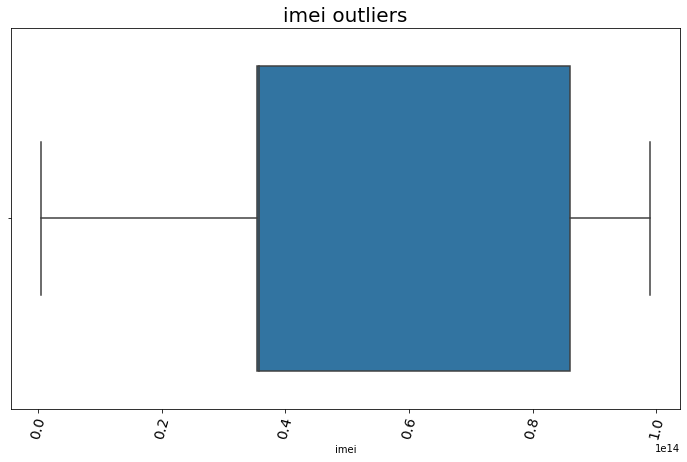

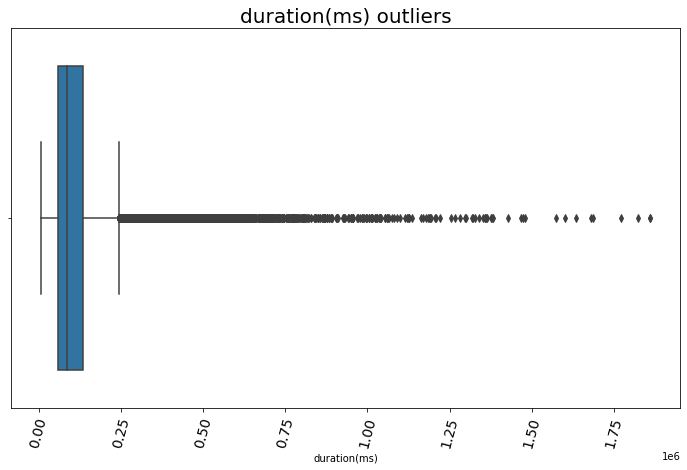

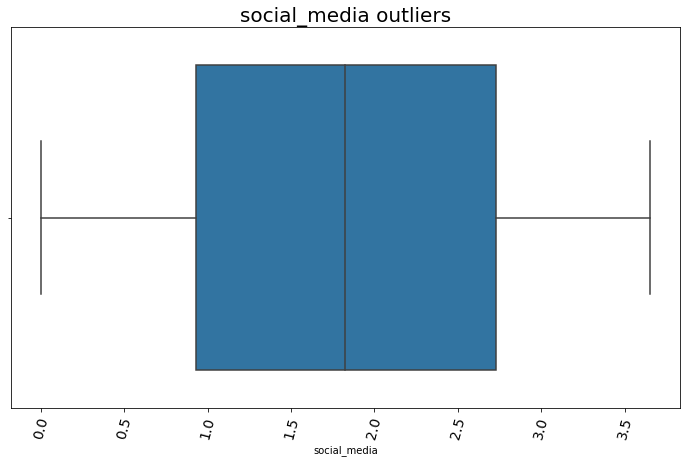

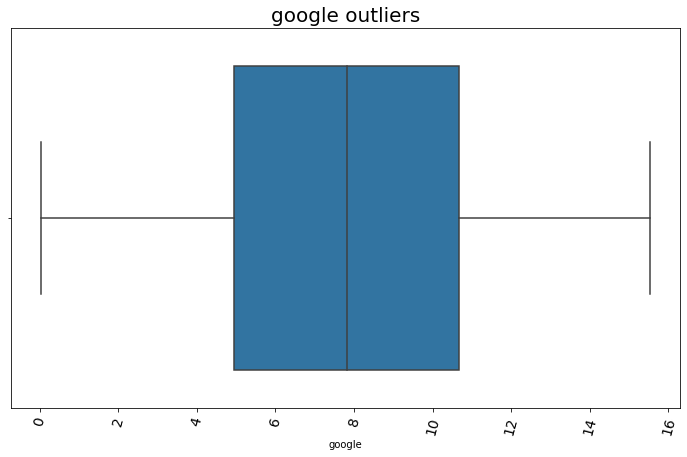

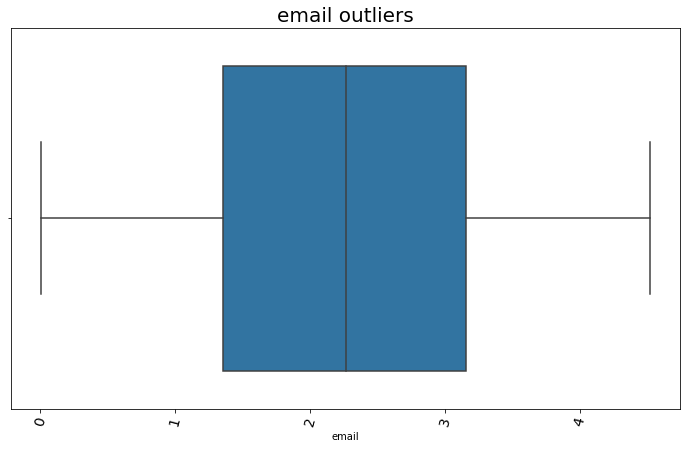

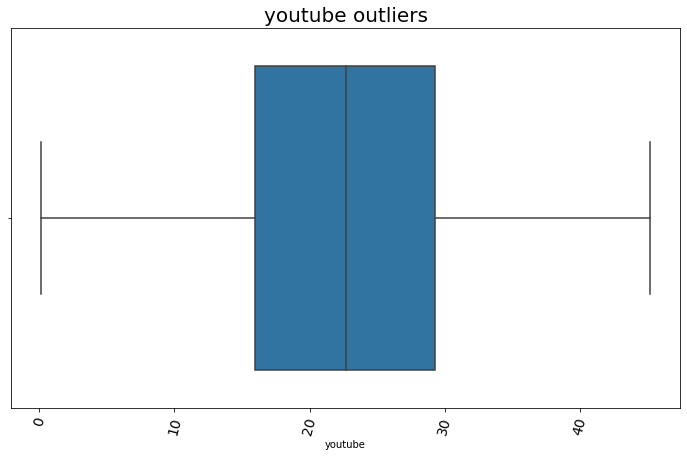

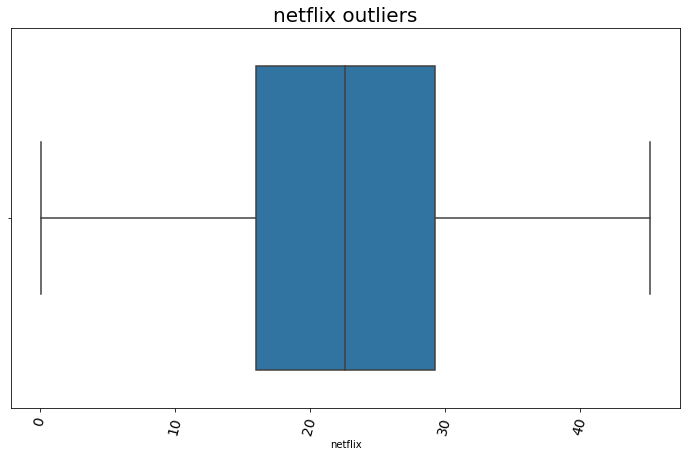

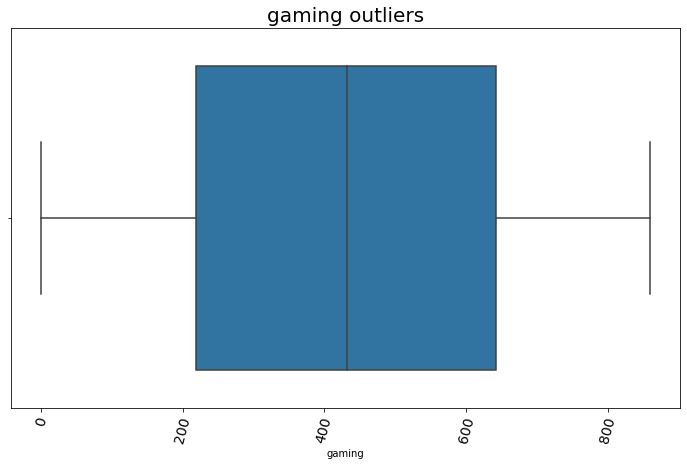

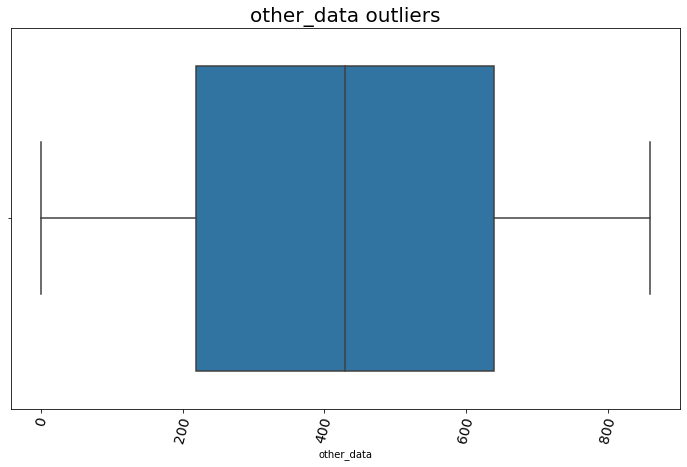

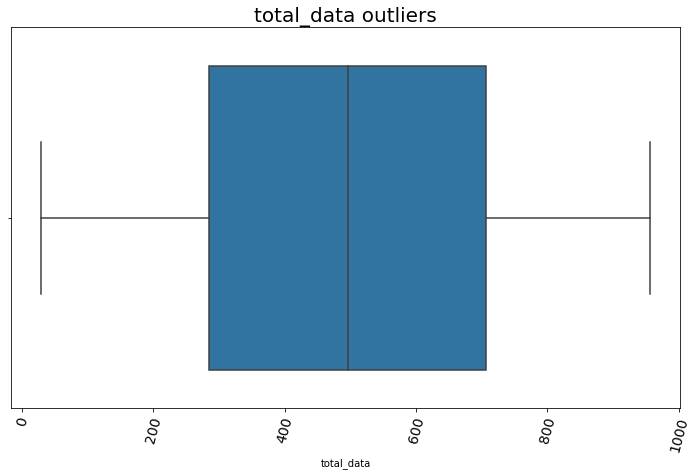

In [69]:
list_of_col = ['imei','duration(ms)','social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other_data', 'total_data']
for col in list_of_col:
    title = f'{col} outliers'
    plotter.plot_box(quantitative_df, col, title)

As depicted from the box plots above the imei data columns and all of the columns related with the xDR session of an application are free of outliers. How ever the duration column as seen from the "duration outliers" plot is highly affected by outliers. For the duration(ms) column we are required to go further to handle outliers. By handling outliers we mean that removing some part of the data that are beyond some offset.

In [72]:
quantitative_df['duration(ms)'] = np.where(quantitative_df['duration(ms)'] > quantitative_df['duration(ms)'].quantile(0.95),
                                         quantitative_df['duration(ms)'].mode(),quantitative_df['duration(ms)'])

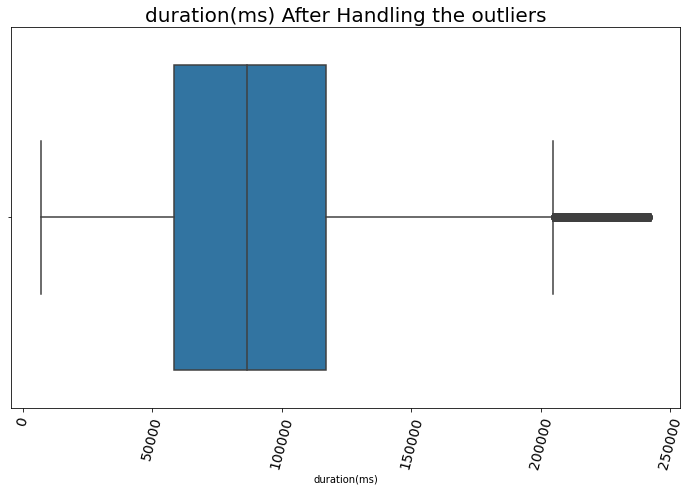

In [73]:
plotter.plot_box(quantitative_df, 'duration(ms)', 'duration(ms) After Handling the outliers')

#### Histogram Plots

<Figure size 648x504 with 0 Axes>

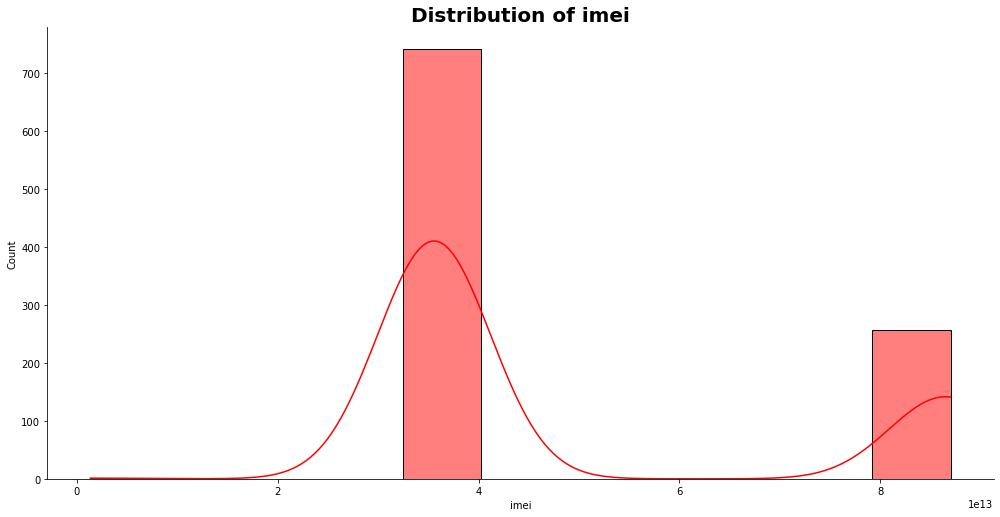

<Figure size 648x504 with 0 Axes>

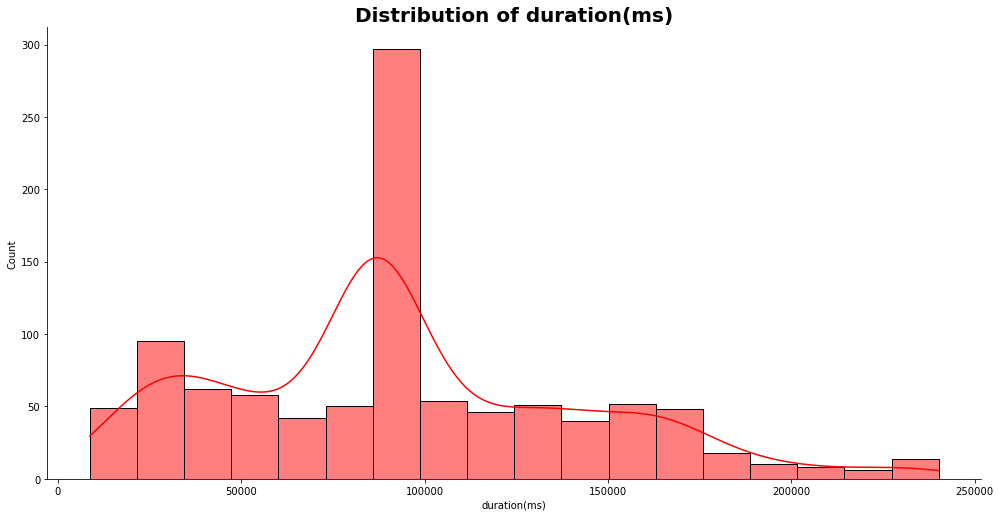

<Figure size 648x504 with 0 Axes>

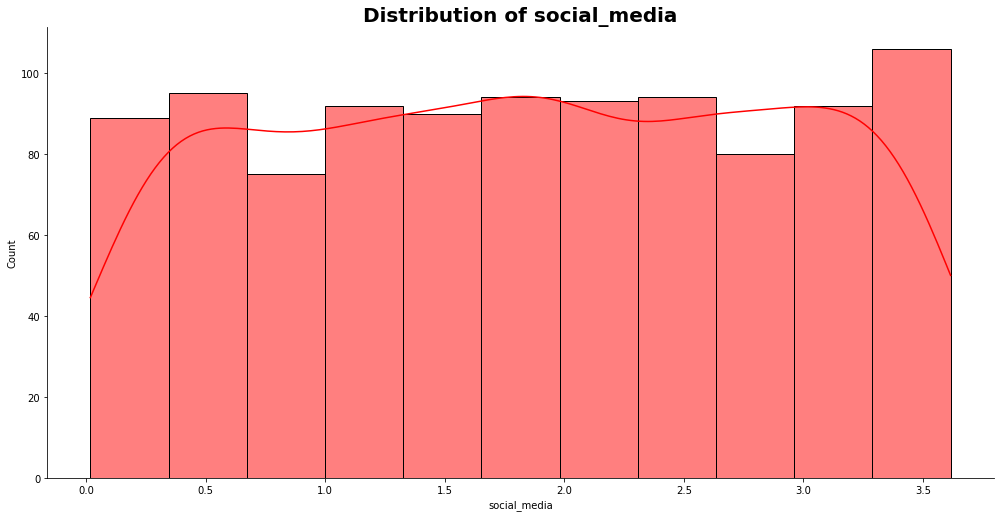

<Figure size 648x504 with 0 Axes>

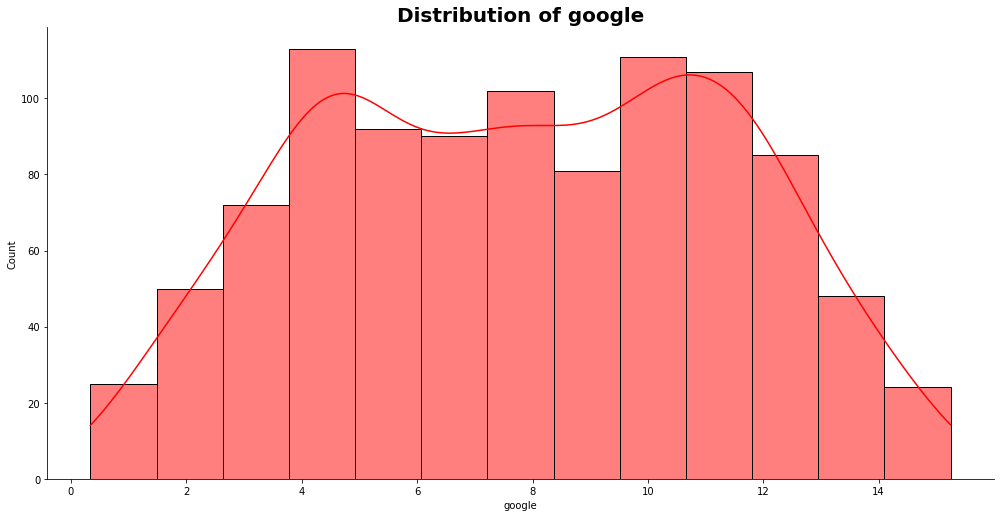

<Figure size 648x504 with 0 Axes>

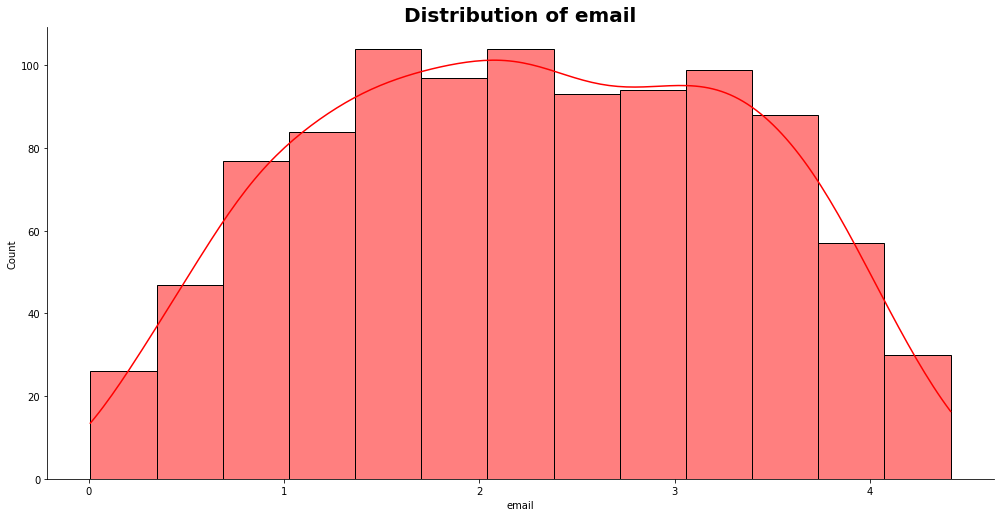

<Figure size 648x504 with 0 Axes>

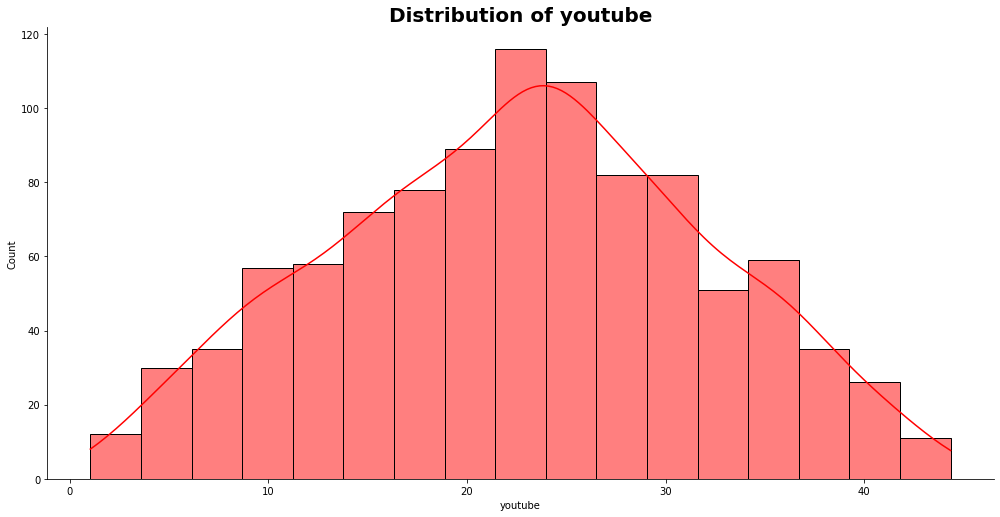

<Figure size 648x504 with 0 Axes>

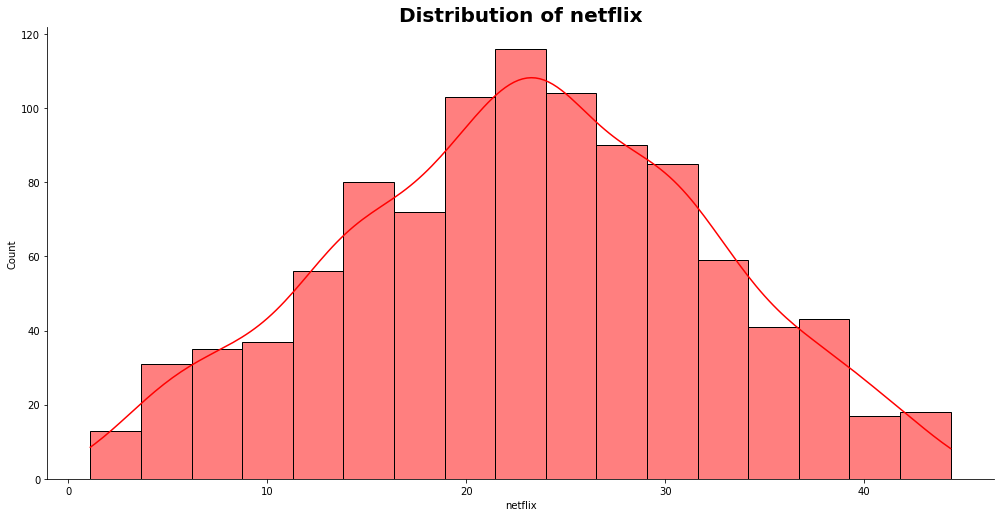

<Figure size 648x504 with 0 Axes>

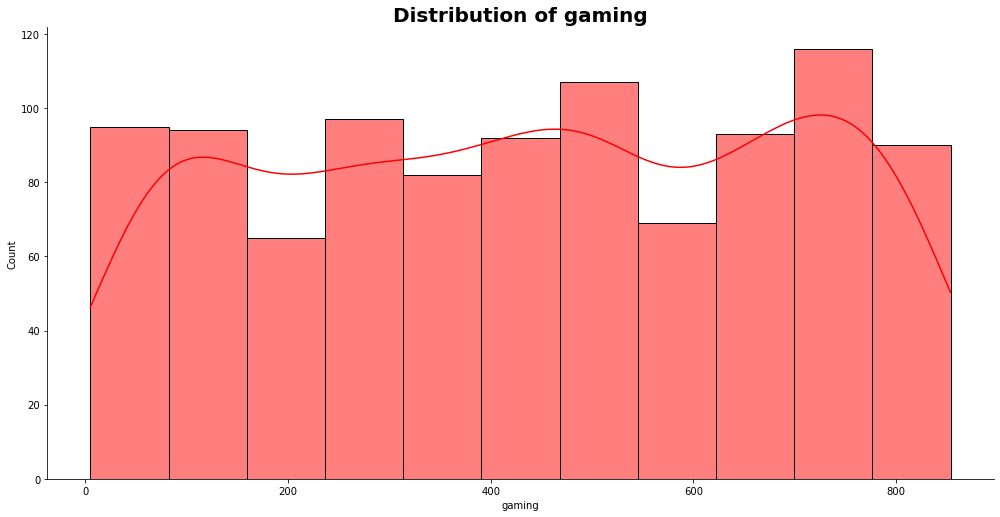

<Figure size 648x504 with 0 Axes>

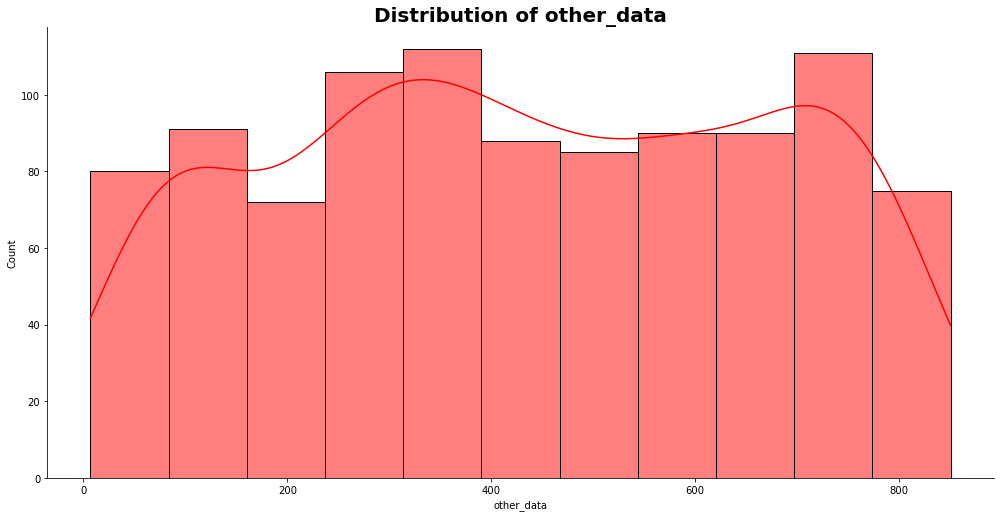

<Figure size 648x504 with 0 Axes>

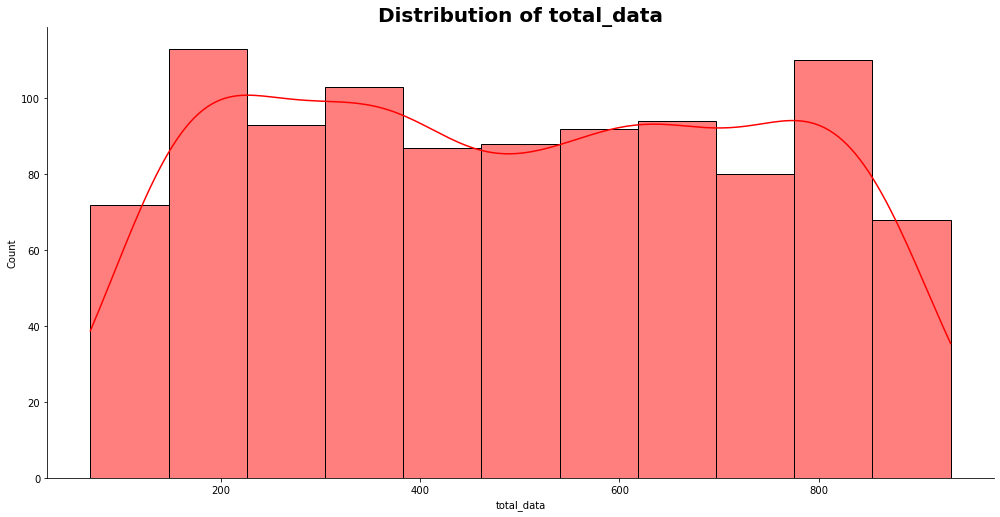

In [78]:
list_of_col = ['imei','duration(ms)','social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other_data', 'total_data']
for col in list_of_col:
    plotter.plot_hist(quantitative_df.sample(1000), col, color='red')

### Multivariate Analysis

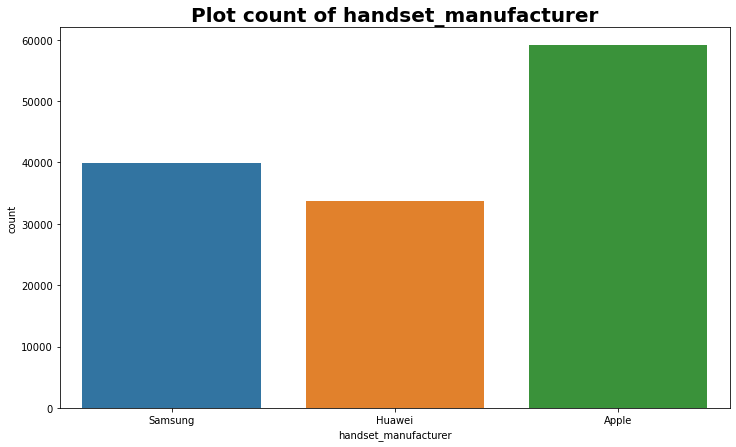

In [86]:
top_manufacturers = new_userOverview.get_top_manufacturer().index[:5].to_list()
filtered_row = exploratory_df['handset_manufacturer'].isin(top_manufacturers)

count_df = exploratory_df[filtered_row]
plotter.plot_count(count_df, 'handset_manufacturer')

The total volume of data used by each application per user can be found ...

In [88]:
total_data = exploratory_df[['msisdn', 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming',  'other_data', 'total_data', 'handset_manufacturer']]
total_data_agg = total_data.groupby('msisdn').sum()
total_data_agg

,social_media,google,email,youtube,netflix,gaming,other_data,total_data
msisdn,,,,,,,,
3.360100e+10,2.232135,4.389005,1.331362,21.624548,27.180981,812.458661,386.570872,878.690574
3.360100e+10,2.660565,5.334863,3.307781,12.432223,11.221763,119.750078,281.710071,156.859643
3.360100e+10,3.195623,3.443126,3.205380,21.333570,19.353900,538.827713,501.693672,595.966483
3.360101e+10,0.280294,9.678493,2.284670,6.977321,1.942092,391.126127,35.279702,422.320698
3.360101e+10,2.912542,18.499616,3.305469,41.533002,49.201724,1314.797820,804.804484,1457.410944
...,...,...,...,...,...,...,...,...
3.378997e+10,1.413370,9.892882,3.396607,28.226479,30.370302,134.815919,408.107210,208.123067
3.378998e+10,4.250312,10.246473,5.315327,38.012812,51.950311,972.344996,1075.140407,1094.693386
3.379000e+10,0.300183,7.531269,1.006915,26.647843,14.902538,660.361359,295.282817,714.641641


### Bivariate Analysis b/n total_data and each application

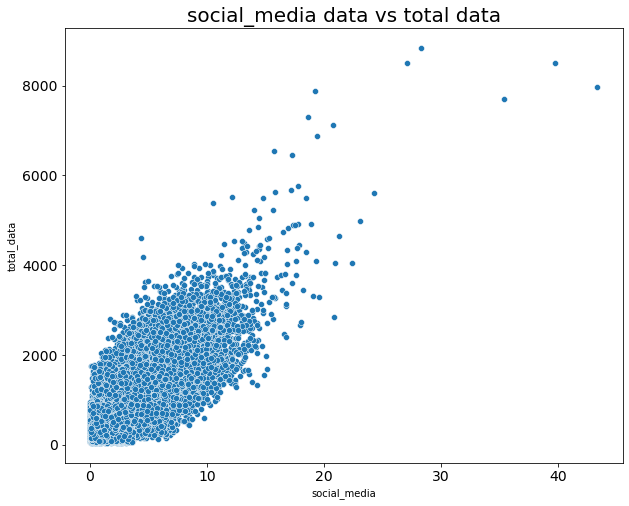

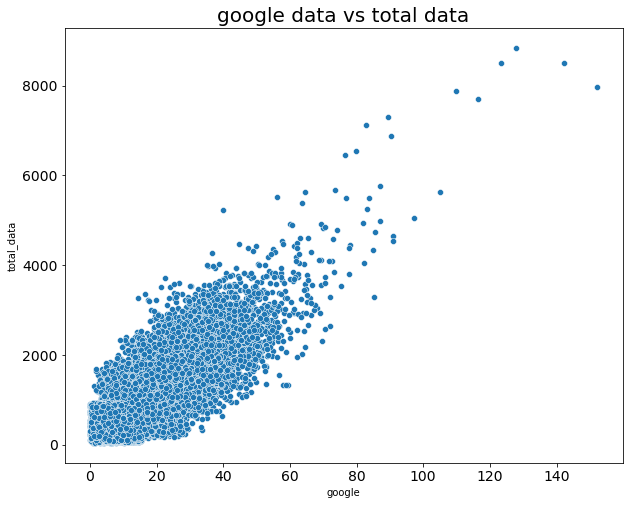

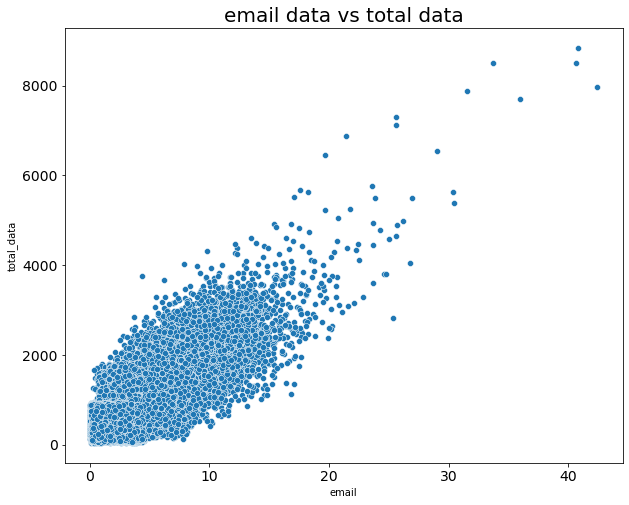

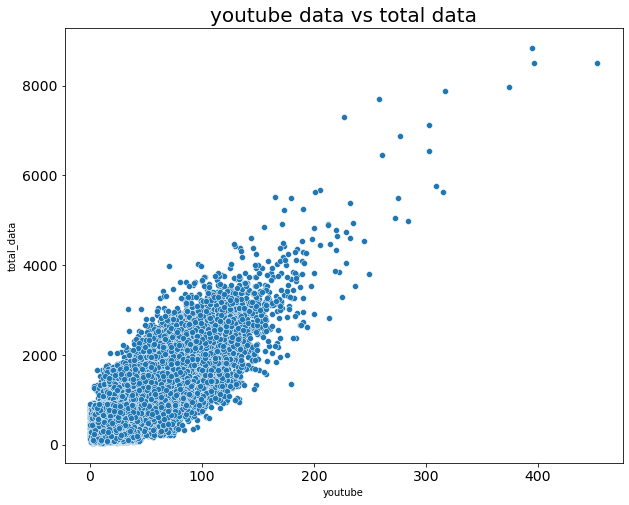

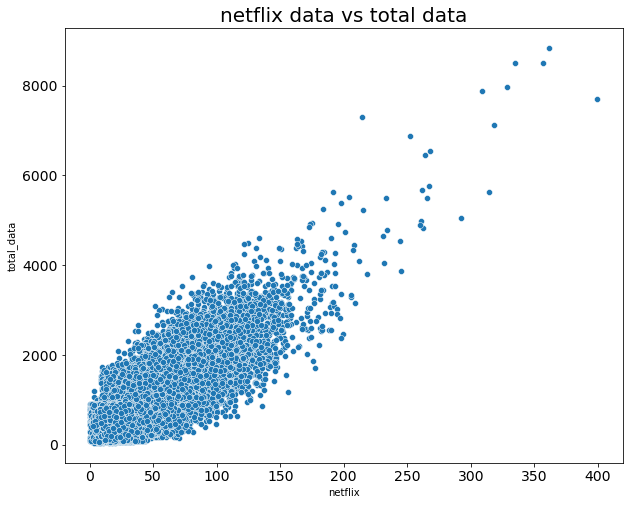

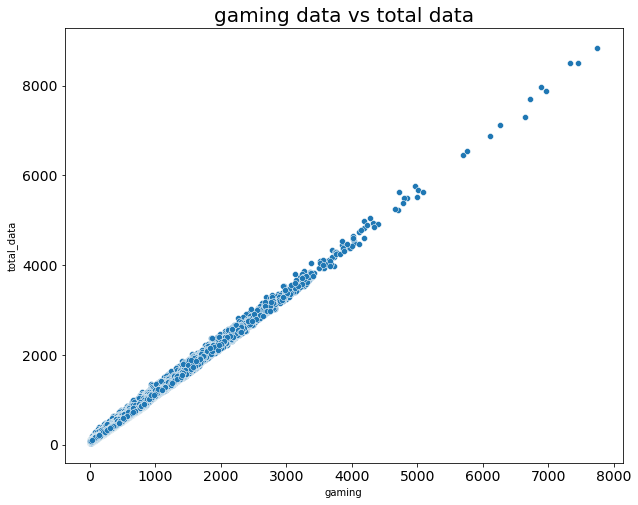

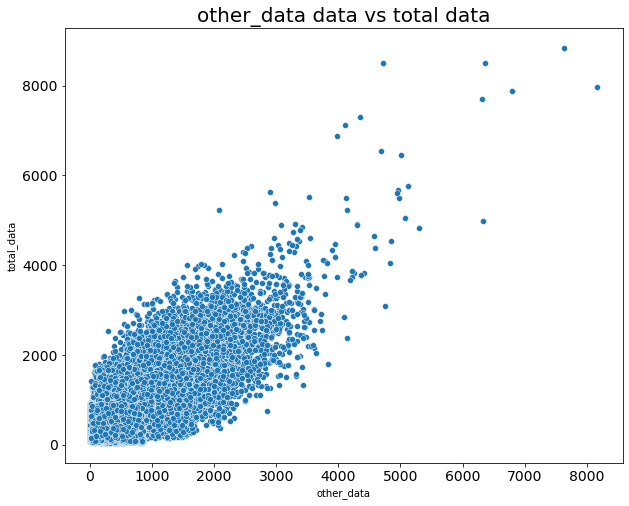

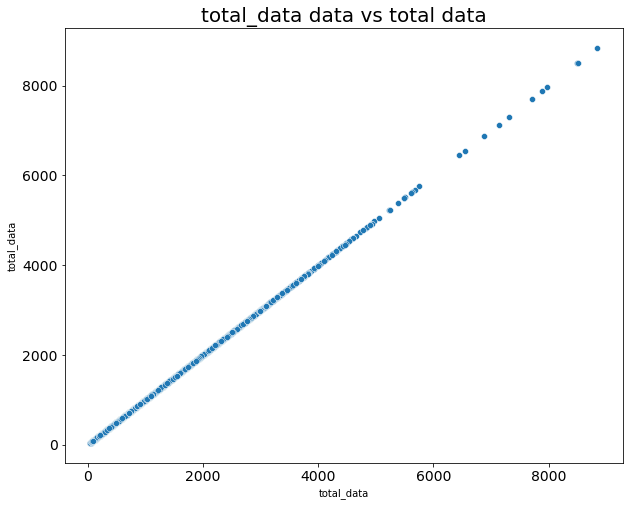

In [91]:
list_of_col = ['social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other_data', 'total_data']
for col in list_of_col:
    title = f'{col} data vs total data'
    plotter.plot_scatter(total_data_agg, col, 'total_data', title,  None,  None)

In [92]:
total_data = explore_feature_df[['social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming',  'other_data', 'total_data']]

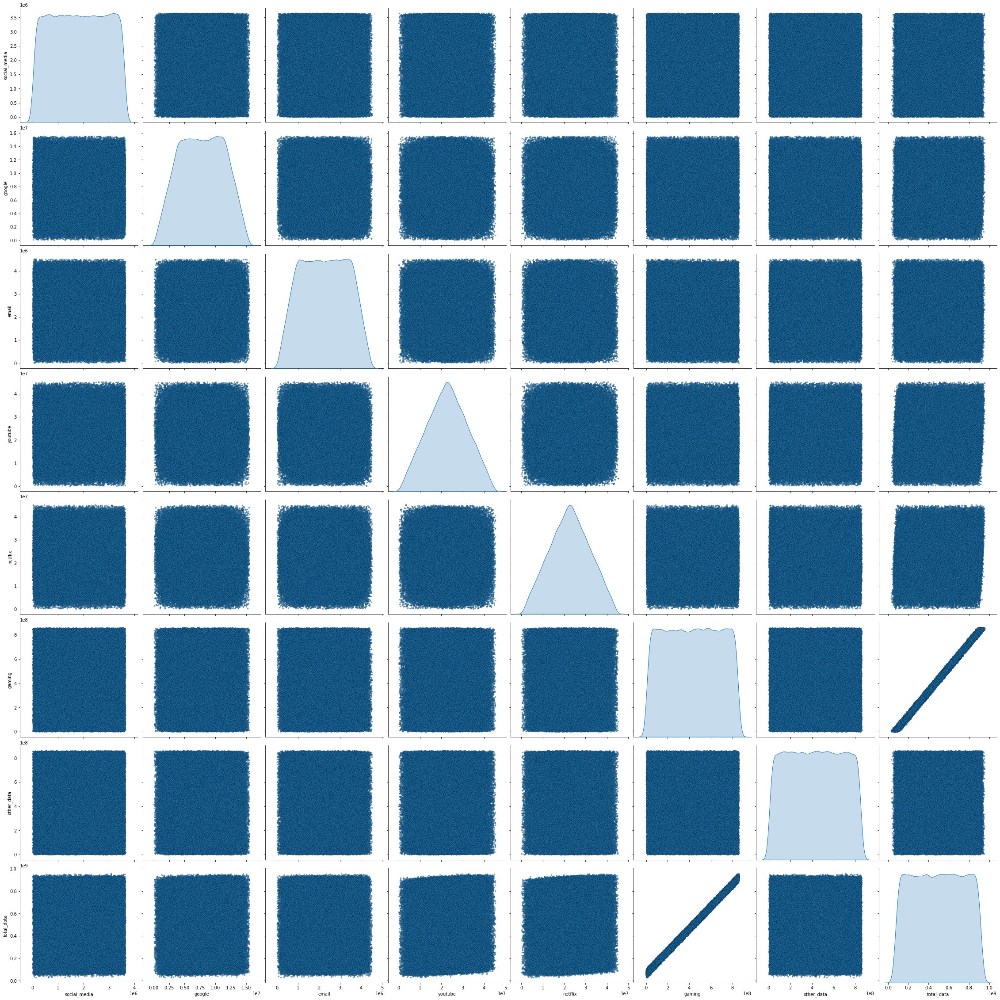

In [93]:
sns.color_palette("crest", as_cmap=True)
sns.pairplot(total_data, diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'},
             height=4)

### Multivarent Analysis for categorical data

In [94]:
social_media_total = total_data.sum()[0]
google_total = total_data.sum()[1]
email_total = total_data.sum()[2]
youtube_total = total_data.sum()[3]
netflix_total = total_data.sum()[4]
gaming_total = total_data.sum()[5]
other_data = total_data.sum()[6]


app_total_count_df = pd.DataFrame(columns=['app', 'total'])
app_total_count_df['app'] = ['social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other_data']

app_total_count_df['total'] = [social_media_total, google_total, email_total, youtube_total, netflix_total, gaming_total,  other_data]
app_total_count_df

,app,total
0,social_media,2.684786e+11
1,google,1.146922e+12
2,email,3.318382e+11
3,youtube,3.325905e+12
4,netflix,3.324049e+12
5,gaming,6.321529e+13
6,other_data,6.305541e+13


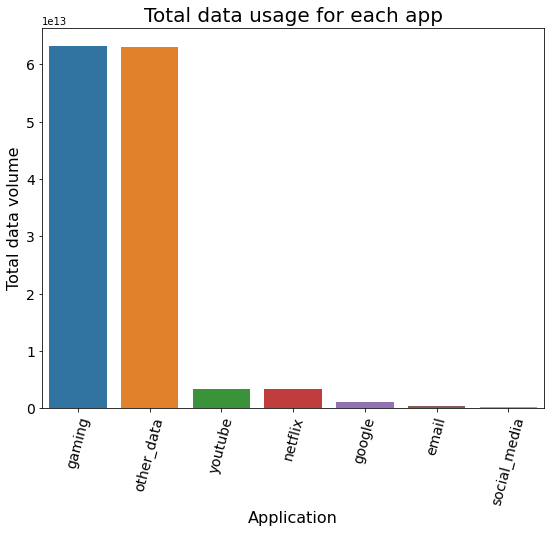

In [96]:
plotter.plot_bar(app_total_count_df.sort_values(by=['total'], ascending = False), x_col='app', y_col='total', title="Total data usage for each app", xlabel="Application", ylabel="Total data volume")

In [97]:
px.pie(app_total_count_df, values="total",
                     names="app", width=700, height=500)

In [99]:
from sklearn.preprocessing import MinMaxScaler

# I scaled the duration by dividing it to 1000 to easily
# compare it with total data which has already been converted to megabytes

scaled_explore_feature_df = exploratory_df[['msisdn', 'total_data', 'duration(ms)']]

scaled_explore_feature_df['duration(ms)'] = exploratory_df['duration(ms)']/1000
scaled_explore_feature_df = scaled_explore_feature_df.rename(columns={'duration(ms)': 'duration'})

scaled_explore_feature_df_agg = scaled_explore_feature_df.groupby('msisdn').agg({'duration':'sum', 'total_data': 'sum'})

deciles = pd.qcut(scaled_explore_feature_df_agg['duration'], 5, labels=["1st_decile", "2nd_decile",
                                                      "3rd_decile", "4th_decile",
                                                      "5th_decile"])



explore_feature_df_with_decile = scaled_explore_feature_df_agg.copy()

explore_feature_df_with_decile['decile'] = deciles

explore_feature_df_with_decile_agg = explore_feature_df_with_decile.groupby('decile').agg({'total_data': 'sum',
                                                                                           'duration': 'sum'})
explore_feature_df_with_decile_agg

,total_data,duration
decile,,
1st_decile,1.143024e+07,647473.886
2nd_decile,1.227127e+07,1778391.158
3rd_decile,1.156663e+07,2130274.650
4th_decile,1.377434e+07,3414760.017
5th_decile,2.378375e+07,7486422.650


<Figure size 720x504 with 0 Axes>

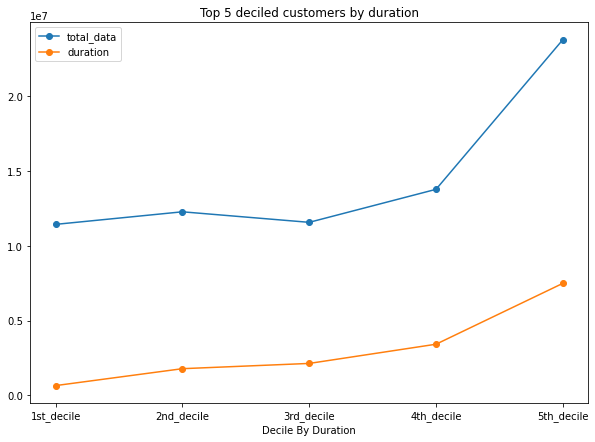

In [100]:
plt.figure(figsize=(10,7))
explore_feature_df_with_decile_agg.plot(linestyle='-', marker='o', figsize=(10,7), title='Top 5 deciled customers by duration').set_xlabel("Decile By Duration")
plt.xticks(np.arange(len(explore_feature_df_with_decile_agg.index)), explore_feature_df_with_decile_agg.index)

plt.show()